# Julia 機器學習：Clustering 分群模型

## 作業 028：資料分群

從提供的檔案中讀取資料，利用分群模型將資料分群後並將資料視覺化。資料中有 15 群，並利用 k-means 去對資料做分群。資料取自 http://cs.uef.fi/sipu/datasets/

In [1]:
using Clustering, CSV, DataFrames, Gadfly

## 讀取資料

In [2]:
data = CSV.read("Day_028_s1-set.csv")

,x,y
,Int64,Int64
1,664159,550946
2,665845,557965
3,597173,575538
4,618600,551446
5,635690,608046
6,588100,557588
7,582015,546191
8,604678,574577
9,572029,518313


In [3]:
X = Matrix(data)'

2×5000 LinearAlgebra.Adjoint{Int64,Array{Int64,2}}:
 664159  665845  597173  618600  635690  …  691827  650661  599647  684091
 550946  557965  575538  551446  608046     863963  861267  858702  842566

## K-means 分群模型

In [4]:
k = 15
result = kmeans(X, k)
dump(result)

KmeansResult{Array{Float64,2},Float64,Int64}
  centers: Array{Float64}((2, 15)) [343998.4527363184 244654.88563049852 … 287762.4357142857 167727.38805970148; 166486.65174129352 847642.0410557184 … 154408.11428571428 348147.6]
  assignments: Array{Int64}((5000,)) [10, 10, 10, 10, 10, 10, 10, 10, 10, 10  …  5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
  costs: Array{Float64}((5000,)) [3.932068355740967e9, 3.848989170432373e9, 7.995064249267578e7, 6.902876748818359e8, 2.0012318050158691e9, 6.095935751503906e8, 1.3812885645126953e9, 1.9057899489746094e6, 4.318575461277832e9, 1.7479023515625e6  …  2.782454939169922e8, 5.595652414916992e9, 2.9773947540195312e9, 1.2777467247363281e8, 4.674976160428711e9, 1.0817732159863281e8, 4.381570026557617e8, 4.130407882919922e8, 5.097647169803223e9, 5.81265660621582e8]
  counts: Array{Int64}((15,)) [201, 341, 319, 651, 352, 327, 335, 319, 316, 298, 349, 350, 367, 140, 335]
  wcounts: Array{Int64}((15,)) [201, 341, 319, 651, 352, 327, 335, 319, 316, 298, 349, 350, 367, 

## 取得分群

In [5]:
data[!, :cluster] = string.(assignments(result));

## 取得群中心

In [6]:
result.centers

2×15 Array{Float64,2}:
 343998.0  244655.0  823421.0  230408.0  …  398962.0  287762.0  167727.0
 166487.0  847642.0  731145.0  559522.0     412121.0  154408.0  348148.0

## 視覺化分群結果

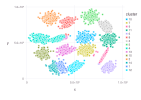

In [7]:
plot(data, x="x", y="y", color="cluster", Geom.point)

In [8]:
ci=range(colorant"blue", stop=colorant"green", length=k)

In [9]:
centers=convert(DataFrame, result.centers')

,x1,x2
,Float64,Float64
1,343998.0,166487.0
2,244655.0,847642.0
3,823421.0,731145.0
4,230408.0,559522.0
5,670929.0,862766.0
6,852058.0,157686.0
7,617927.0,399416.0
8,417717.0,784297.0
9,801617.0,321123.0


In [10]:
rename!(centers, [:x, :y])

,x,y
,Float64,Float64
1,343998.0,166487.0
2,244655.0,847642.0
3,823421.0,731145.0
4,230408.0,559522.0
5,670929.0,862766.0
6,852058.0,157686.0
7,617927.0,399416.0
8,417717.0,784297.0
9,801617.0,321123.0


In [11]:
describe(centers)

,variable,mean,min,median,max,nunique,nmissing,eltype
,Symbol,Float64,Float64,Float64,Float64,Nothing,Nothing,DataType
1,x,522016.0,167727.0,508053.0,858948.0,,,Float64
2,y,469413.0,154408.0,412121.0,862766.0,,,Float64


In [12]:
centers[!, :cluster] = string.(range(1, length=nrow(centers)))

15-element Array{String,1}:
 "1"
 "2"
 "3"
 "4"
 "5"
 "6"
 "7"
 "8"
 "9"
 "10"
 "11"
 "12"
 "13"
 "14"
 "15"

In [13]:
show(centers, allrows=true, allcols=true)

15×3 DataFrame
│ Row │ x        │ y        │ cluster │
│     │ Float64  │ Float64  │ String  │
├─────┼──────────┼──────────┼─────────┤
│ 1   │ 343998.0 │ 166487.0 │ 1       │
│ 2   │ 244655.0 │ 847642.0 │ 2       │
│ 3   │ 823421.0 │ 731145.0 │ 3       │
│ 4   │ 230408.0 │ 559522.0 │ 4       │
│ 5   │ 670929.0 │ 862766.0 │ 5       │
│ 6   │ 852058.0 │ 157686.0 │ 6       │
│ 7   │ 617927.0 │ 399416.0 │ 7       │
│ 8   │ 417717.0 │ 784297.0 │ 8       │
│ 9   │ 801617.0 │ 321123.0 │ 9       │
│ 10  │ 606058.0 │ 574532.0 │ 10      │
│ 11  │ 858948.0 │ 546260.0 │ 11      │
│ 12  │ 508053.0 │ 175645.0 │ 12      │
│ 13  │ 398962.0 │ 412121.0 │ 13      │
│ 14  │ 287762.0 │ 154408.0 │ 14      │
│ 15  │ 167727.0 │ 348148.0 │ 15      │

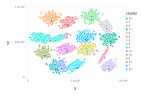

In [16]:
p = plot( 
    Theme(major_label_font_size=16pt),
    layer(centers, x="x", y="y", Geom.point, label="cluster", Geom.label),
    layer(data, x="x", y="y", color="cluster", Geom.point)
    )

In [17]:
i = SVG("Day_028_output.svg")
draw(i, p)

false

![Day_028_output.svg](Day_028_output.svg)